In [1]:
from glob import glob
import pandas as pd
import numpy as np
import os
import json
from collections import defaultdict
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.tokenize import word_tokenize
import re
from gensim.models import Word2Vec
from tqdm import tqdm
import wordcloud

In [2]:
import logging
logging.basicConfig(level=logging.INFO,
                    format='%(asctime)s %(levelname)s %(message)s')

In [3]:
df = pd.read_csv('dataset/tmdb_5000_movies_nonull.csv')
df_credits = pd.read_csv('dataset/tmdb_5000_credits.csv')
credits_sub = df_credits.loc[:, ['movie_id', 'cast']].rename(columns={
                                                             'movie_id': 'id'})

df = df[['id', 'budget', 'genres', 'keywords', 'original_language',
         'overview', 'popularity', 'production_companies',
         'production_countries', 'release_date', 'revenue', 'runtime',
         'spoken_languages', 'tagline', 'title', 'vote_average', 'vote_count']]
df = df.merge(credits_sub)

In [4]:
with open('dataset/subtitles/subtitles.json', 'r') as f:
    sub_dict = json.load(f)
sub_dict = defaultdict(str, sub_dict)

In [5]:
# df["subtitles"] = df.title.apply(lambda title: sub_dict[title]) # keep blocks separated
df["subtitles"] = df.title.apply(lambda title: "\n\n".join(
    sub_dict[title]).replace("\n", " "))  # single string
df["subtitles"] = df.subtitles.apply(str)
df.shape
del sub_dict

In [6]:
type(df.subtitles.tolist()[0])

str

In [7]:
# drop movies with no genre info
for i, row in df.iterrows():
    if row['genres'] == '[]':
        df.drop(i, inplace=True)
df = df.dropna()
df.shape

(3956, 19)

In [8]:
df.drop(df[df["subtitles"] == ''].index, inplace=True)
df.reset_index(inplace=True, drop=True)
print(df.shape)
df.tail()

(3037, 19)


,id,budget,genres,keywords,original_language,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,tagline,title,vote_average,vote_count,cast,subtitles
3032,226458,0,"[{""id"": 53, ""name"": ""Thriller""}, {""id"": 27, ""n...","[{""id"": 9712, ""name"": ""possession""}]",en,"During an all-night, drug-fueled party at an a...",3.619167,"[{""name"": ""GO Productions"", ""id"": 2943}, {""nam...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2015-01-16,0,91.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",nederlands,Backmask,4.7,79,"[{""cast_id"": 3, ""character"": ""Father Conway"", ...",The Exeter School for the feeble minded. The ...
3033,692,12000,"[{""id"": 27, ""name"": ""Horror""}, {""id"": 35, ""nam...","[{""id"": 237, ""name"": ""gay""}, {""id"": 900, ""name...",en,Notorious Baltimore criminal and underground f...,4.553644,"[{""name"": ""Dreamland Productions"", ""id"": 407}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",1972-03-12,6000000,93.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",An exercise in poor taste.,Pink Flamingos,6.2,110,"[{""cast_id"": 8, ""character"": ""Divine / Babs Jo...","Hello, moviegoers. This is Mr. Jag... speakin..."
3034,124606,0,"[{""id"": 18, ""name"": ""Drama""}]","[{""id"": 10726, ""name"": ""gang""}, {""id"": 33928, ...",en,A young woman in L.A. is having a bad day: she...,0.918116,"[{""name"": ""Asylum Films"", ""id"": 10571}, {""name...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",1995-09-09,0,98.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Sometimes you've got to break the rules,Bang,6.0,1,"[{""cast_id"": 2, ""character"": ""The Girl"", ""cred...","All right, Saturday is the big day. A lot of ..."
3035,14337,7000,"[{""id"": 878, ""name"": ""Science Fiction""}, {""id""...","[{""id"": 1448, ""name"": ""distrust""}, {""id"": 2101...",en,Friends/fledgling entrepreneurs invent a devic...,23.307949,"[{""name"": ""Thinkfilm"", ""id"": 446}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2004-10-08,424760,77.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",What happens if it actually works?,Primer,6.9,658,"[{""cast_id"": 1, ""character"": ""Aaron"", ""credit_...",Here's what's going to happen. I'm going to re...
3036,9367,220000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...","[{""id"": 5616, ""name"": ""united states\u2013mexi...",es,El Mariachi just wants to play his guitar and ...,14.269792,"[{""name"": ""Columbia Pictures"", ""id"": 5}]","[{""iso_3166_1"": ""MX"", ""name"": ""Mexico""}, {""iso...",1992-09-04,2040920,81.0,"[{""iso_639_1"": ""es"", ""name"": ""Espa\u00f1ol""}]","He didn't come looking for trouble, but troubl...",El Mariachi,6.6,238,"[{""cast_id"": 1, ""character"": ""El Mariachi"", ""c...","Yes. Yes. You know what to do. Good moming,..."


In [9]:
# def text_to_words(text):
#     # remove punctuation and whitespace
#     # but keep hyphens and apostrophes
#     filtered_text = re.sub(r'[^\w\'\s-]',
#                            '', text)
#     return word_tokenize(filtered_text.lower())

In [10]:
# idxs = df.id.tolist()
# %time sub_words = [text_to_words(text) for text in df.subtitles.tolist()]
# subs = dict(zip(idxs, sub_words))
# df["subtitles"] = [" ".join(words) for words in sub_words]

In [11]:
df.head()

,id,budget,genres,keywords,original_language,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,tagline,title,vote_average,vote_count,cast,subtitles
0,19995,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...","[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Enter the World of Pandora.,Avatar,7.2,11800,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","When I was lying there in the VA hospital, wi..."
1,285,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...","[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]","At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[man] ""ln order to affect a timely halt to det..."
2,206647,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...","[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",A Plan No One Escapes,Spectre,6.3,4466,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...",Where are you going? I won't be long. Welcom...
3,49026,250000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...","[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-07-16,1084939099,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",The Legend Ends,The Dark Knight Rises,7.6,9106,"[{""cast_id"": 2, ""character"": ""Bruce Wayne / Ba...",I knew Harvey Dent. I was his friend. And it...
4,49529,260000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...","[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-03-07,284139100,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]","Lost in our world, found in another.",John Carter,6.1,2124,"[{""cast_id"": 5, ""character"": ""John Carter"", ""c...","Subtitles downloaded from Podnapisi.NET Mars,..."


In [12]:
def convert_list(cell):
    """convert the json format to a list of categories"""
    kw_list = []
    for kw in json.loads(cell):
        kw_list.append(kw['name'])
    return kw_list


def larger_n(col, n):
    """filter the column"""
    keywords = defaultdict(int)
    for row in df[col]:
        row = json.loads(row)
        for entry in row:
            keywords[entry['name']] += 1
    kw_cnt = sorted(keywords.items(), key=lambda x: -x[1])
    return [kw[0] for kw in kw_cnt if kw[1] >= n]


def extract_gender(cell):
    """Extract cast gender"""
    female = 0
    male = 0
    for item in json.loads(cell):
        if item['gender'] == 1:
            female += 1
        elif item['gender'] == 2:
            male += 1
        else:
            continue
    return female, male


def concat_names(cell):
    """Concatenate first names and last names"""
    names = []
    for name in cell:
        names.append(name.replace(' ', ''))
    return names


def list2str(cell):
    """Convert list to string"""
    return ' '.join(cell)


def transform_cols(df, cols_to_transform):
    """Transform columns of a dataframe.
    cols_to_transform should be a dict(col_name: filter value n)
    """
    for col_name in cols_to_transform.keys():
        larger_col = larger_n(col_name, cols_to_transform[col_name])
        if col_name == 'cast':
            gen = df[col_name].apply(extract_gender)
            df['female_pct'] = gen.apply(lambda x: x[0]/(x[0]+x[1]+0.001))
            df['male_pct'] = gen.apply(lambda x: x[1]/(x[0]+x[1]+0.001))

        df[col_name] = df[col_name].apply(convert_list)\
            .apply(lambda cell: [kw for kw in cell if kw in larger_col])
    return df

In [13]:
cols_to_transform = {'keywords': 30,
                     'genres': 0,
                     'production_companies': 5,
                     'production_countries': 3,
                     'spoken_languages': 10,
                     'cast': 2}

df_movies = transform_cols(df, cols_to_transform)

In [14]:
from sklearn.preprocessing import MultiLabelBinarizer

mlb = MultiLabelBinarizer()
mlb.fit(df_movies['genres'])

MultiLabelBinarizer(classes=None, sparse_output=False)

In [15]:
import datetime

In [16]:
all_with_genres_dummies = pd.DataFrame(mlb.transform(
    df['genres']), columns=mlb.classes_).add_prefix('genre_')

In [17]:
# df_new = pd.DataFrame(all_with_genres_dummies.columns, columns=["genre"])
# df_new.head()

In [18]:
from tqdm import tqdm

In [19]:
# df_new = pd.DataFrame(all_with_genres_dummies.columns, columns=["genre"])
all_text = []
for genre_name in tqdm(all_with_genres_dummies.columns):
    print(genre_name)
    all_genre_subs = df[all_with_genres_dummies[genre_name]
                        == 1].subtitles.tolist()
    genre_text = " ".join(all_genre_subs)
    #genre_text = " ".join(all_genre_subs[:2])
    all_text.append(genre_text)
# df_new["subtitle"] = all_text
# df_new.head()

 20%|██        | 4/20 [00:00<00:00, 30.84it/s]

genre_Action
genre_Adventure
genre_Animation
genre_Comedy
genre_Crime
genre_Documentary
genre_Drama
genre_Family
genre_Fantasy
genre_Foreign
genre_History
genre_Horror
genre_Music
genre_Mystery
genre_Romance


100%|██████████| 20/20 [00:00<00:00, 74.54it/s]

genre_Science Fiction
genre_TV Movie
genre_Thriller
genre_War
genre_Western


In [20]:
# df_new.subtitle = df_new.subtitle.astype(str)

In [21]:
import re
import nltk
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS


def tokenize(text, mode="lemma", min_len=3):
    """
    A tokenizer, remove special characters punctuation and replace them with a space, stem the word
    """
    text = text.lower()
    cleanString = text.replace('"', ' ')
    cleanString = re.sub('[^a-z\'A-Z-]', ' ', text)
    words = [word for word in cleanString.split(' ') if (
        re.search('[a-zA-Z]', word) and len(word) >= min_len)]
    english = list(ENGLISH_STOP_WORDS)
    goodwords = [w for w in words if w not in english]
    #goodwords = words
    if mode == "stem":
        stemmer = PorterStemmer()
        stemmed = [stemmer.stem(word) for word in goodwords]
        return stemmed
    if mode == "lemma":
        lemmatizer = WordNetLemmatizer()
        lemmas = [lemmatizer.lemmatize(word) for word in goodwords]
        return lemmas
    return goodwords

In [22]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(tokenizer=tokenize,  # stop_words='english',
                        binary=False,
                        ngram_range=(1, 2), min_df=10, max_df=.9, max_features=2000)
%time sub_vec = tfidf.fit_transform(all_text)

CPU times: user 7min 59s, sys: 3.87 s, total: 8min 3s
Wall time: 8min 4s


In [23]:
# tfidf = TfidfVectorizer(stop_words='english', binary=False,
#                         ngram_range=(1, 2), min_df=1)
# #sub_vec = tfidf.fit_transform(df_new['subtitle'].tolist())
# sub_vec = tfidf.fit_transform(all_text)

In [24]:
# .add_prefix('sub_')
sub_df = pd.DataFrame(sub_vec.toarray(), columns=tfidf.get_feature_names())
sub_df["movie_genre"] = all_with_genres_dummies.columns
sub_df.head()

,'cause i'm,-all,-all right,-and,-are,-come,-don't,-get,-good,-he,...,you're trying,you're you're,you've seen,you--,young man,younger,yup,zoe,zone,movie_genre
0,0.006241,0.007726,0.006236,0.009807,0.004220,0.008730,0.008499,0.009603,0.005825,0.009034,...,0.007489,0.008618,0.008380,0.005468,0.009093,0.006300,0.004755,0.008737,0.015275,genre_Action
1,0.006316,0.007662,0.006301,0.011493,0.007766,0.009668,0.008698,0.008799,0.008905,0.010147,...,0.009215,0.013047,0.012425,0.007455,0.016153,0.006523,0.006316,0.002767,0.012529,genre_Adventure
2,0.008190,0.006701,0.005077,0.018614,0.005956,0.009374,0.008190,0.006640,0.006329,0.005956,...,0.007818,0.017869,0.008935,0.005956,0.013030,0.002978,0.012285,0.003166,0.008190,genre_Animation
3,0.014558,0.009919,0.008685,0.014415,0.008849,0.012616,0.009206,0.007487,0.010562,0.009170,...,0.009527,0.014380,0.008028,0.008671,0.014094,0.008956,0.008813,0.012094,0.011097,genre_Comedy
4,0.006086,0.008761,0.007648,0.007825,0.003879,0.007508,0.007223,0.008280,0.004615,0.008293,...,0.005283,0.007959,0.005150,0.007424,0.006354,0.003946,0.004882,0.001219,0.005551,genre_Crime


In [25]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt







  0%|          | 0/20 [00:00<?, ?it/s]

genre_Action


<Figure size 2880x2880 with 0 Axes>

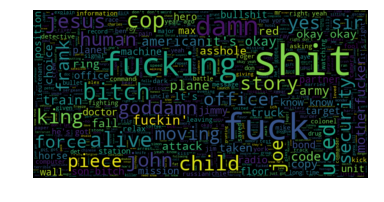

genre_Action


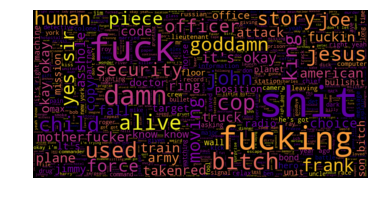

genre_Action


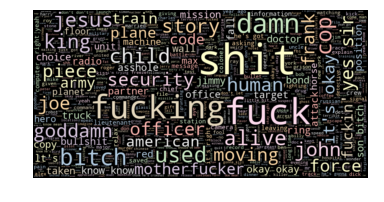

genre_Action


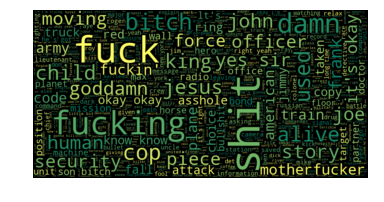







  5%|▌         | 1/20 [00:15<04:56, 15.58s/it]

genre_Adventure


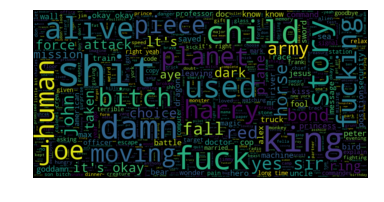

genre_Adventure


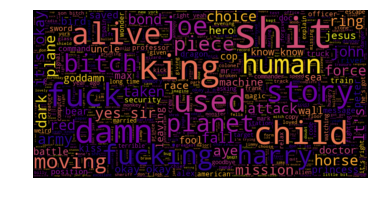

genre_Adventure


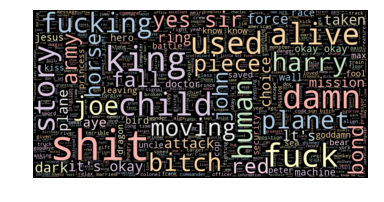

genre_Adventure


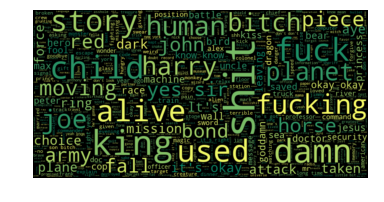







 10%|█         | 2/20 [00:30<04:35, 15.31s/it]

genre_Animation


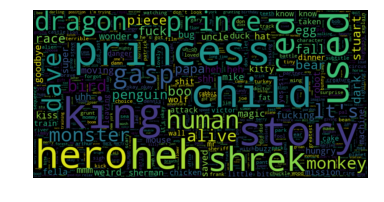

genre_Animation


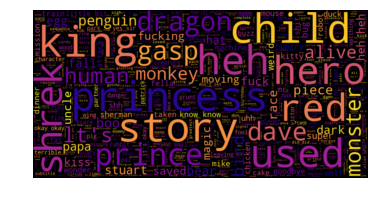

genre_Animation


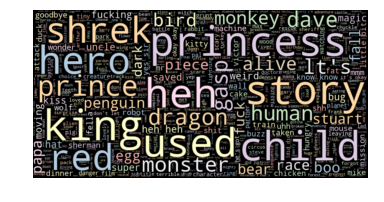

genre_Animation


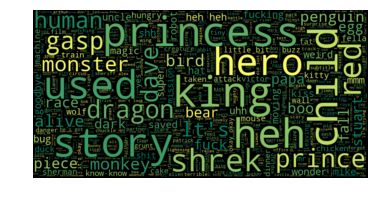







 15%|█▌        | 3/20 [00:44<04:14, 15.00s/it]

genre_Comedy


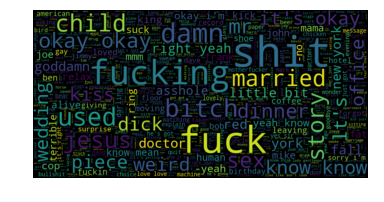

genre_Comedy


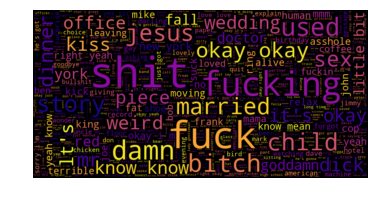

genre_Comedy


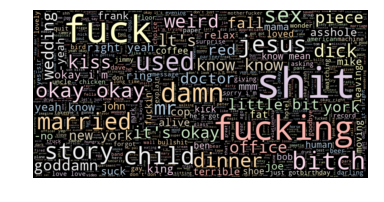

genre_Comedy


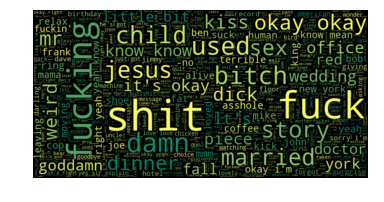







 20%|██        | 4/20 [00:59<04:00, 15.01s/it]

genre_Crime


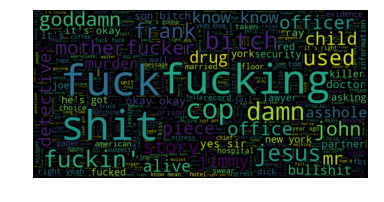

genre_Crime


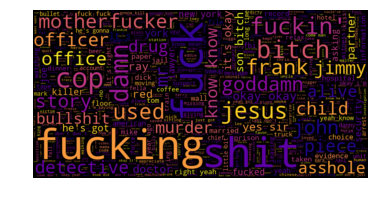

genre_Crime


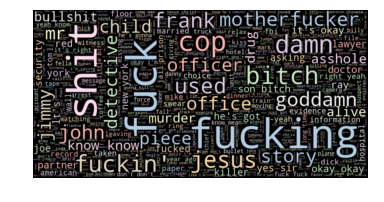

genre_Crime


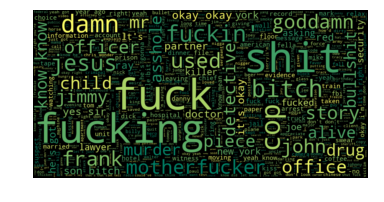







 25%|██▌       | 5/20 [01:13<03:42, 14.80s/it]

genre_Documentary


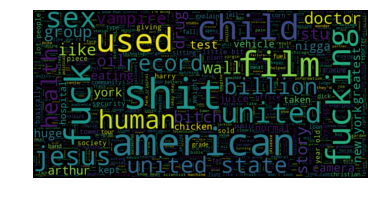

genre_Documentary


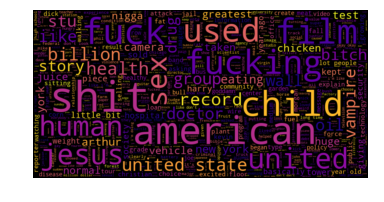

genre_Documentary


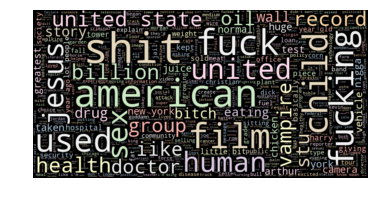

genre_Documentary


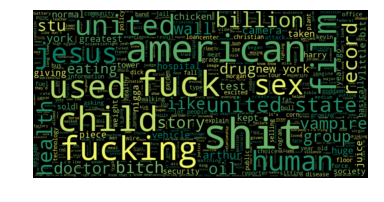







 30%|███       | 6/20 [01:28<03:26, 14.77s/it]

genre_Drama


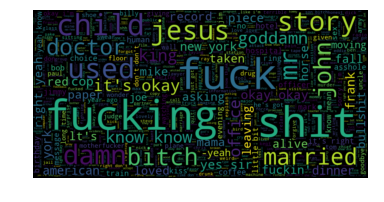

genre_Drama


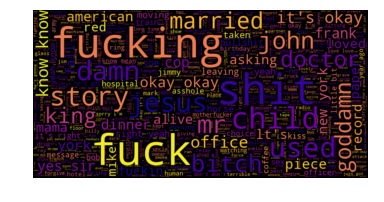

genre_Drama


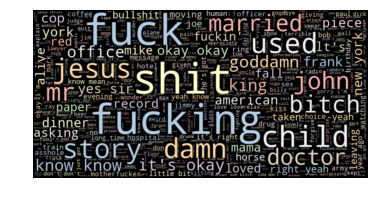

genre_Drama


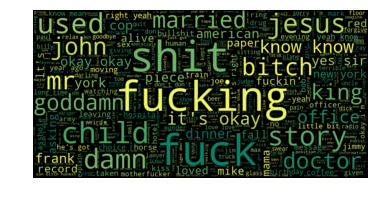







 35%|███▌      | 7/20 [01:47<03:30, 16.16s/it]

genre_Family


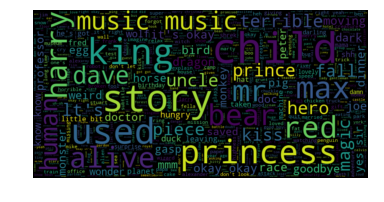

genre_Family


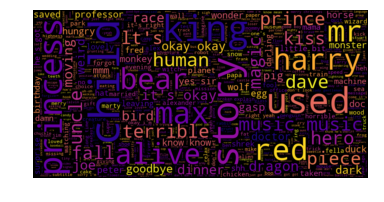

genre_Family


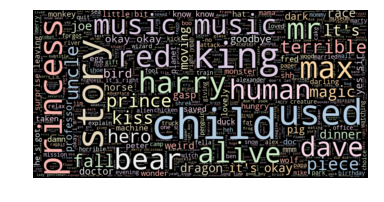

genre_Family


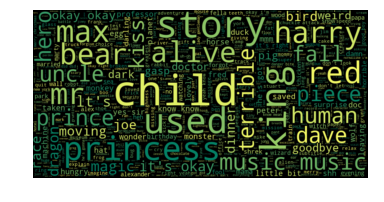







 40%|████      | 8/20 [02:02<03:08, 15.74s/it]

genre_Fantasy


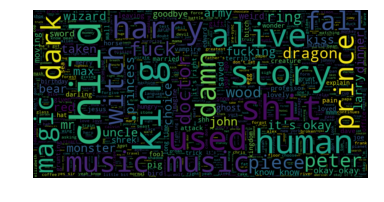

genre_Fantasy


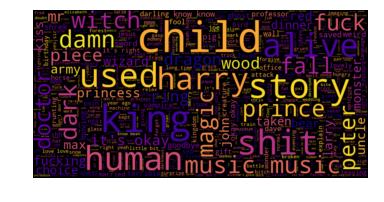

genre_Fantasy


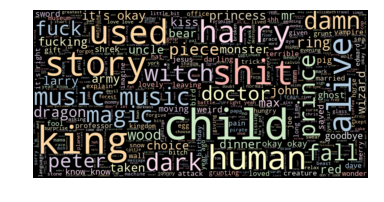

genre_Fantasy


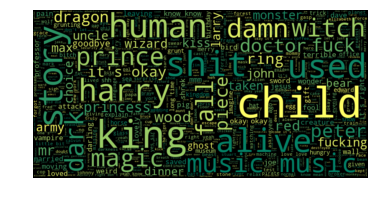







 45%|████▌     | 9/20 [02:15<02:43, 14.88s/it]

genre_Foreign


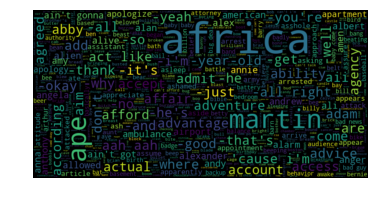

genre_Foreign


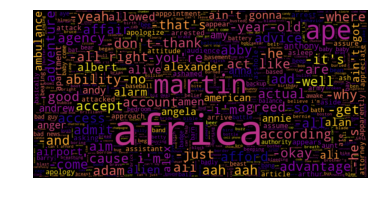

genre_Foreign


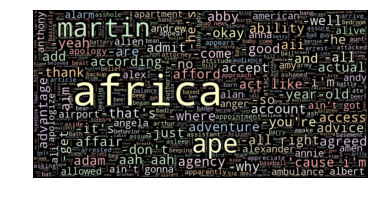

genre_Foreign


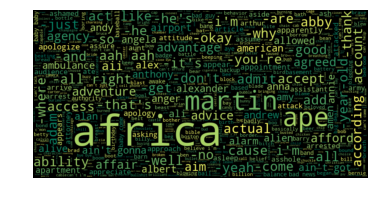







 50%|█████     | 10/20 [02:29<02:25, 14.56s/it]

genre_History


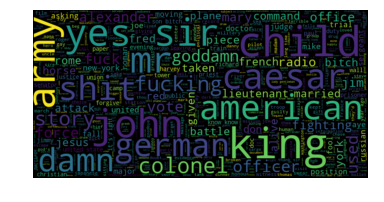

genre_History


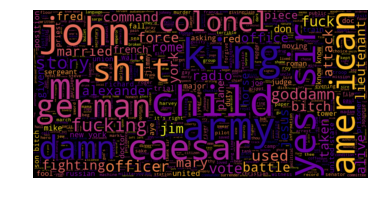

genre_History


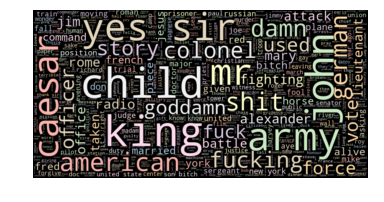

genre_History


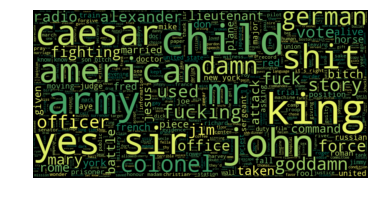







 55%|█████▌    | 11/20 [02:43<02:10, 14.54s/it]

genre_Horror


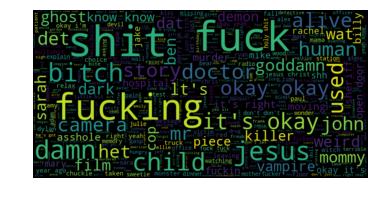

genre_Horror


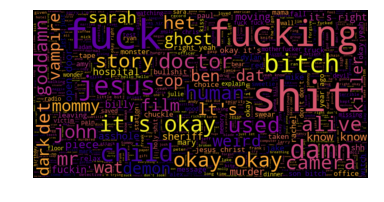

genre_Horror


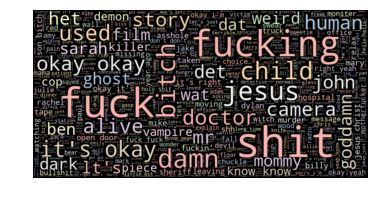

genre_Horror


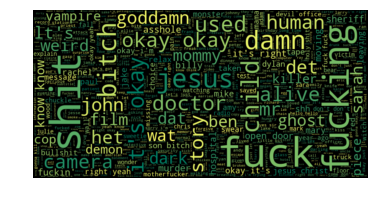







 60%|██████    | 12/20 [02:57<01:55, 14.38s/it]

genre_Music


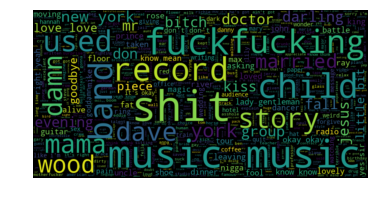

genre_Music


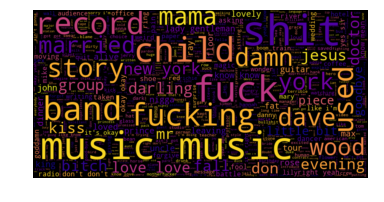

genre_Music


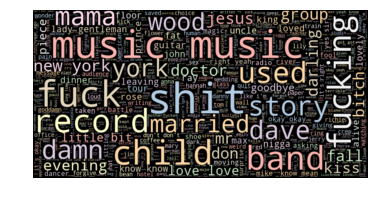

genre_Music


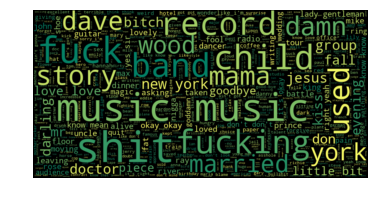







 65%|██████▌   | 13/20 [03:11<01:39, 14.15s/it]

genre_Mystery


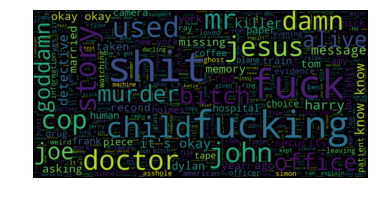

genre_Mystery


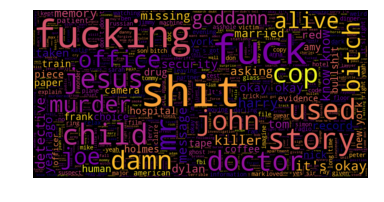

genre_Mystery


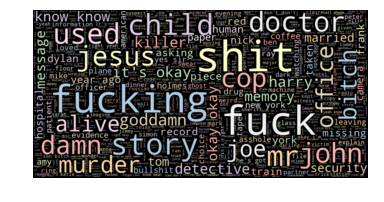

genre_Mystery


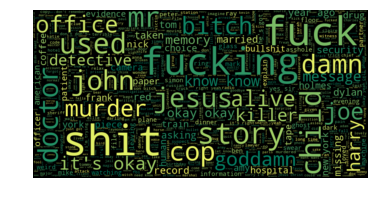







 70%|███████   | 14/20 [03:26<01:26, 14.34s/it]

genre_Romance


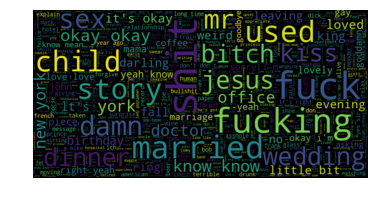

genre_Romance


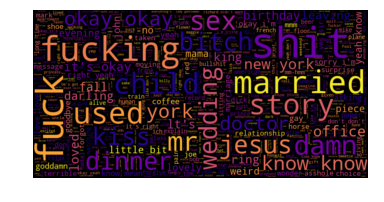

genre_Romance


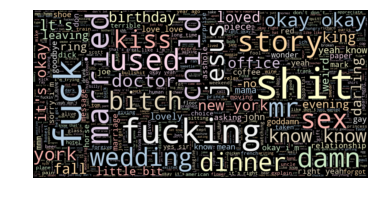

genre_Romance


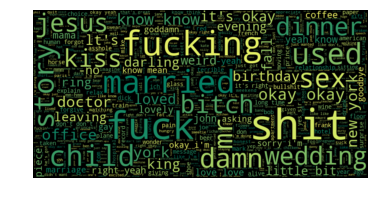







 75%|███████▌  | 15/20 [03:41<01:12, 14.55s/it]

genre_Science Fiction


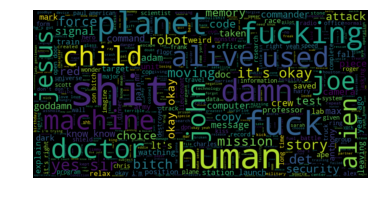

genre_Science Fiction


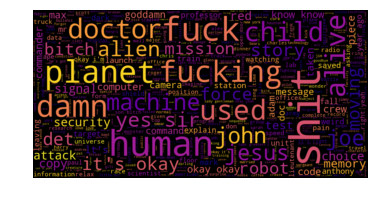

genre_Science Fiction


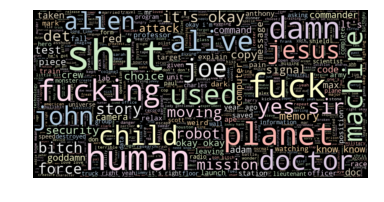

genre_Science Fiction


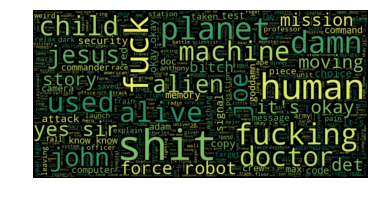







 80%|████████  | 16/20 [03:55<00:57, 14.45s/it]

genre_TV Movie


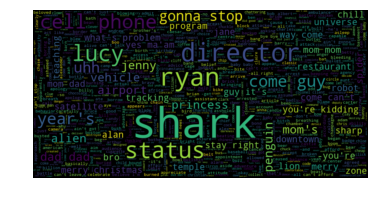

genre_TV Movie


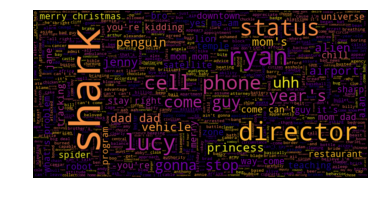

genre_TV Movie


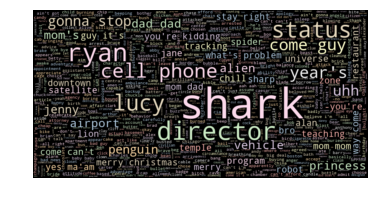

genre_TV Movie


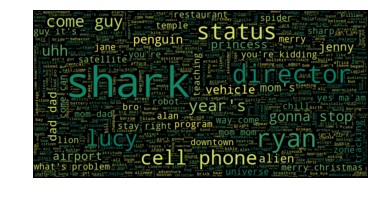







 85%|████████▌ | 17/20 [04:11<00:44, 14.97s/it]

genre_Thriller


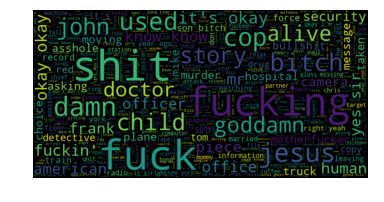

genre_Thriller


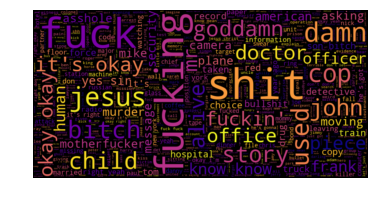

genre_Thriller


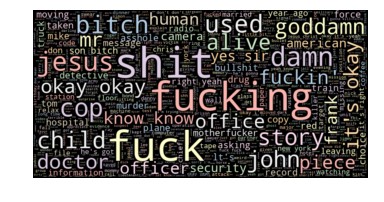

genre_Thriller


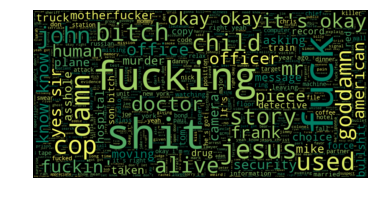







 90%|█████████ | 18/20 [04:26<00:29, 14.94s/it]

genre_War


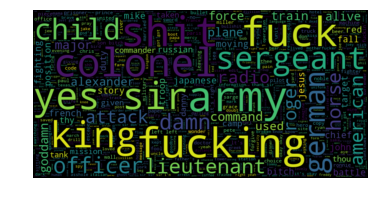

genre_War


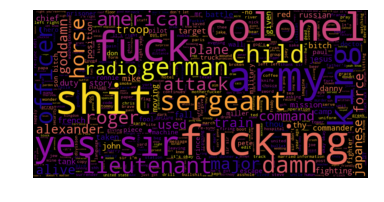

genre_War


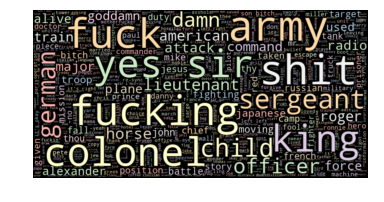

genre_War


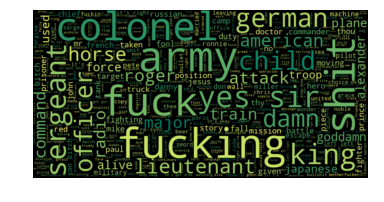







 95%|█████████▌| 19/20 [04:41<00:14, 14.79s/it]

genre_Western


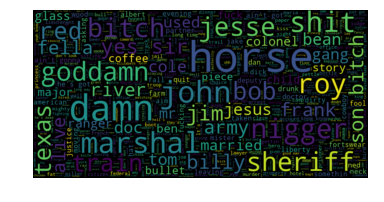

genre_Western


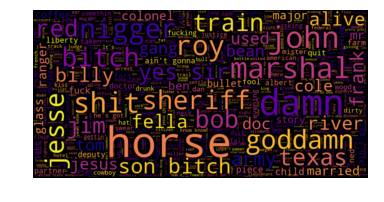

genre_Western


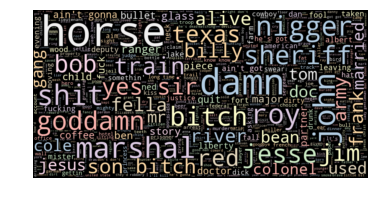

genre_Western


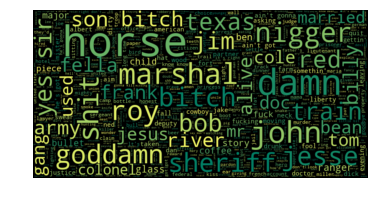







100%|██████████| 20/20 [04:54<00:00, 14.46s/it]







In [40]:
plt.figure(figsize=(40, 40))

for genre_name in tqdm(all_with_genres_dummies.columns):
    for colormap in ["viridis", "plasma", "Pastel1", "summer"]:
        print(genre_name)

        weights = sub_df[sub_df["movie_genre"] == genre_name].drop(
            'movie_genre', axis=1).values[0]
        weights[weights == 0] = 1e-20
        genre_dict = dict(zip(tfidf.get_feature_names(), weights))
        wordcloud = WordCloud(width=800, height=400, max_font_size=100, max_words=2000, colormap=colormap).\
            generate_from_frequencies(genre_dict).to_file(
                "wordcloud_{}_{}.png".format(genre_name, colormap))
        plt.figure()
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.show()